In [335]:
from mlebe.threed.training.utils.utils import json_file_to_pyobj
from mlebe.threed.training.dataio.loaders.mlebe_loader import mlebe_dataset
from mlebe.training.utils import general
from mlebe.threed.training.dataio.transformation import get_dataset_transformation
import pandas as pd
from mlebe.training.utils import data_loader
from mlebe.threed.training.models import get_model
import os
from mlebe.threed.training.dataio.loaders.mlebe_loader import Experiment_config
import json
import nibabel as nib
from matplotlib import pyplot as plt
import numpy as np

In [336]:
def plot_per_sample_histograms(data, ids = None , log = False , bins = 50, title = None, show=False):
    n_cols = 3
    n_rows = int(len(data) / n_cols) + 1
    fig = plt.figure(figsize=(10, 10))
    for sample_index in range(len(data)):
        plot_index = sample_index + 1
        plt.subplot(n_rows, n_cols, plot_index)
        plt.hist(data[sample_index].reshape((-1, )), bins=bins, log=log)
        sub_title = str(sample_index)
        if ids is not None:
            sub_title += '_' + ids[sample_index]
        plt.title(sub_title)
    if title is not None:
        plt.suptitle(title)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    if show:
        plt.show()
    return fig

In [337]:
config_path = '/home/hendrik/src/MLEBE/mlebe/threed/training/checkpoints/bias_field_prob-0.5_criterion-cross_entropy_model_type-unet_pct_multi_att_dsv_normalization-normalize_medic_random_elastic_prob-0_scale_size-[64, 64, 96, 1]_with_arranged_mask-True_with_blacklist-True1/trained_mlebe_config_anat.json'
json_opts = json_file_to_pyobj(config_path)
model = get_model(json_opts.model)
with open(config_path) as file:
    config = json.load(file)
config['data']['studies'] = ['irsabi']
#config['augmentation']['mlebe']['scale_size'] = [128,128,96,1]
with open('temp/temp_config.json', 'w') as outfile:
    json.dump(config, outfile, indent=4)
json_opts = json_file_to_pyobj('temp/temp_config.json')



Initialising model unet_pct_multi_att_dsv


/home/hendrik/src/MLEBE/mlebe/threed/training/models/networks_other.py:42: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight.data, a=0, mode='fan_in')
/home/hendrik/src/MLEBE/mlebe/threed/training/models/networks_other.py:46: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  init.normal(m.weight.data, 1.0, 0.02)
/home/hendrik/src/MLEBE/mlebe/threed/training/models/networks_other.py:47: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias.data, 0.0)


Loading the model 271_net_unet_pct_multi_att_dsv.pth - epoch 271
Model [FeedForwardSegmentation] is created


In [338]:
%%capture
split_opts = json_opts.data_split
ds_transform = get_dataset_transformation('mlebe', opts=json_opts.augmentation,
                                              max_output_channels=2)
dataset = mlebe_dataset(json_opts.data.template_dir, json_opts.data.data_dir, json_opts.data, split='test',
                             transform=ds_transform['valid'],
                             train_size=False, split_seed=split_opts.seed, training_shape = json_opts.augmentation.mlebe.scale_size[:3])

In [339]:
pd.set_option("display.max_rows", None)
# take arbitrary volume from irsabi dataset
uid = 'sub-4001_ses-ofM_acq-TurboRARElowcov_T2w'
selection = dataset.selection
print(selection.loc[selection['uid'] == uid])

   data_set subject session      acquisition type  \
31   irsabi    4001     ofM  TurboRARElowcov  T2w   

                                         uid  \
31  sub-4001_ses-ofM_acq-TurboRARElowcov_T2w   

                                                 path  
31  /mnt/data/hendrik/mlebe_data/irsabi/generic_pr...  


In [340]:
%%capture
data_paths = data_loader.load_bidsdata(os.path.expanduser('/usr/share/'), studies='irsabi_bidsdata')

# take first volume with uid:
uid = 'sub-4001_ses-ofMcF1_acq-TurboRARElowcov_T2w'
bids_path = data_paths[0]
bids_volume = nib.load(bids_path).get_data()
preprocessed_volume = nib.load(selection.loc[selection['uid'] == uid, 'path'].item()).get_data()

# 1. Exploring the bids data
## 1.1 Visualising the bids volume

(120, 120, 14)


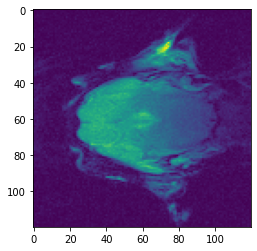

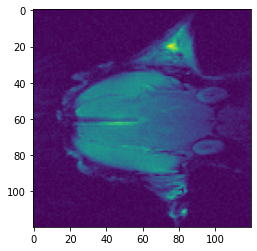

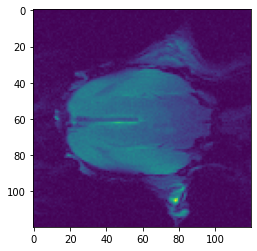

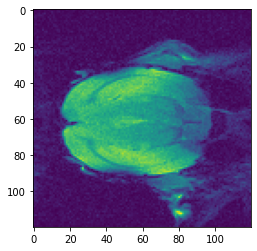

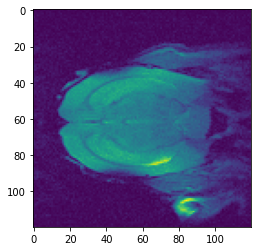

...

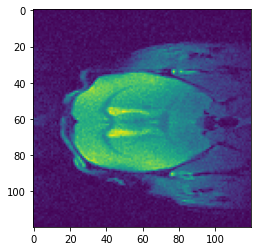

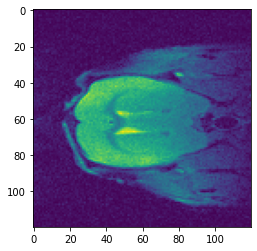

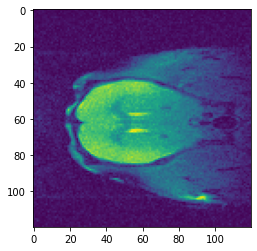

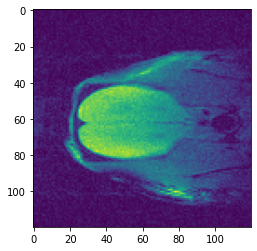

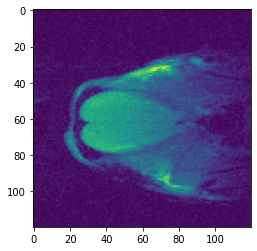

In [341]:
# Visualize bids_volume
print(bids_volume.shape)
for i in range(bids_volume.shape[-1]):
    plt.imshow(bids_volume[...,i])
    plt.show()

## 1.2 Resampling the bids volume

In [342]:
# resample bids_volume
resampled_path = 'temp/resampled_input.nii.gz'
resampled_nii_path = os.path.abspath(os.path.expanduser(resampled_path))
resample_cmd = 'ResampleImage 3 {input} '.format(input=bids_path) + resampled_nii_path + ' 0.2x0.2x0.2'
os.system(resample_cmd)
print(resample_cmd)

ResampleImage 3 /usr/share/irsabi_bidsdata/sub-4001/ses-ofMcF1/anat/sub-4001_ses-ofMcF1_acq-TurboRARElowcov_T2w.nii.gz /home/hendrik/docsrc/mlebe/prepare/classifier/temp/resampled_input.nii.gz 0.2x0.2x0.2


## 1.3 Visualising the resampled bids volume

(100, 45, 45)


/home/hendrik/miniconda3/envs/perfusionct/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  


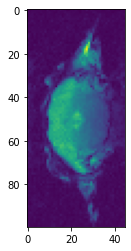

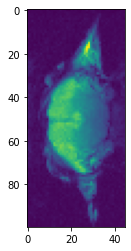

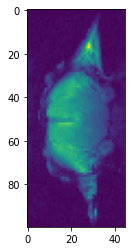

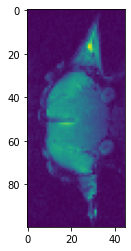

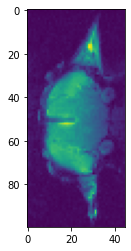

...

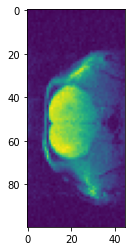

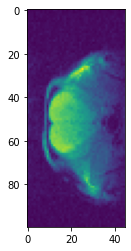

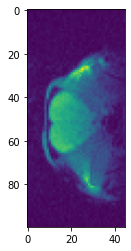

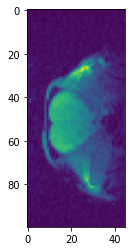

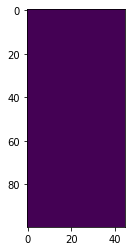

In [343]:
# visualize resampled bids volume
resampled_bids = nib.load(resampled_nii_path).get_data()
print(resampled_bids.shape)
for i in range(resampled_bids.shape[-1]):
    plt.imshow(resampled_bids[...,i])
    plt.show()

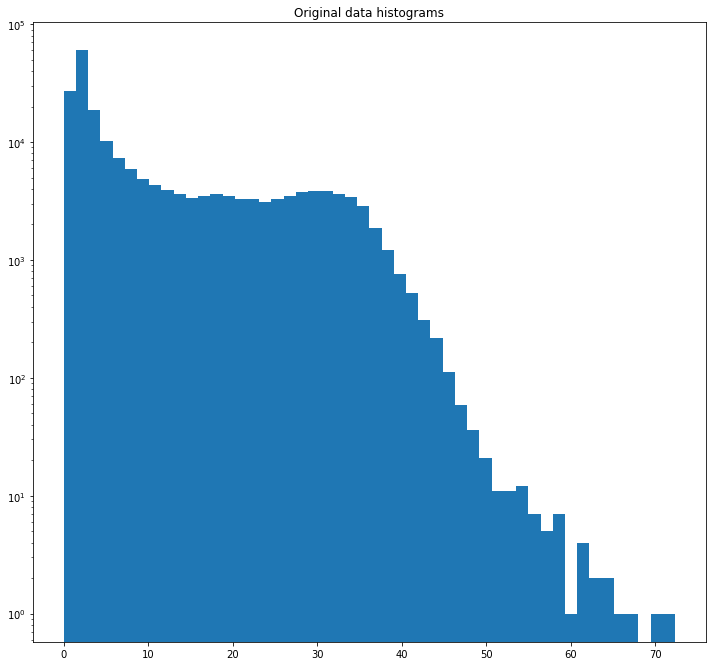

In [344]:
# Histogram after resampling
#plot_per_sample_histograms([resampled_bids], log=True, title='Original data histograms')
fig = plt.figure(figsize=(10, 10))
plt.hist(resampled_bids.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('Original data histograms')
plt.show()


## 1.4 Preprocessing the bids volume
The preprocessing function reshapes the volume into the desired shape by first zero-padding the smaller dimension to the same size as the bigger one and then reshaping the image with cv2.resize. The pading is done to conserve the image height/ width ratio.

In [345]:
print(resampled_bids.shape)
prediction_shape = json_opts.augmentation.mlebe.scale_size[:2]
# switching to z,x,y
resampled_bids_temp = np.moveaxis(resampled_bids, 2, 0)
ori_shape = resampled_bids_temp.shape
bids_preprocessed = general.preprocess(resampled_bids_temp, prediction_shape, 'coronal', switched_axis=True, normalize = False)
print(bids_preprocessed.shape)

(100, 45, 45)
(45, 64, 64)


## 1.5 Comparing the bids volume to the preprocessed bids volume
resampled bids volume on the left, preprocessed bids volume on the right

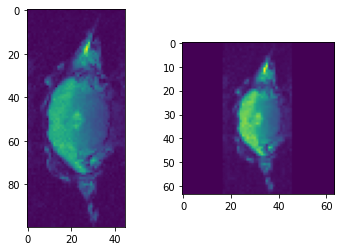

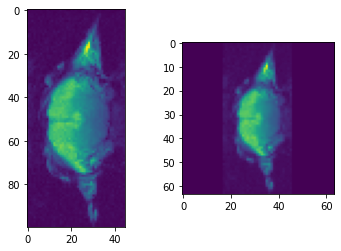

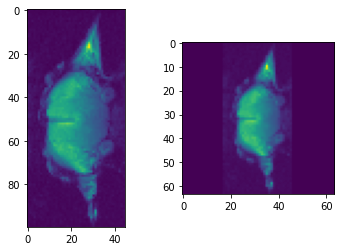

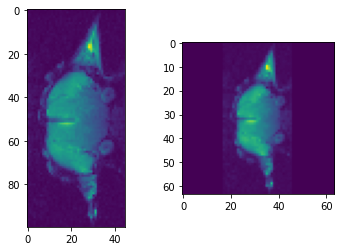

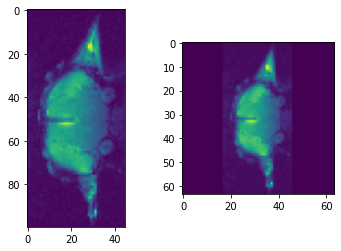

...

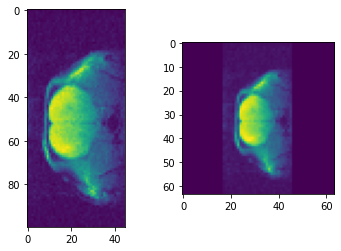

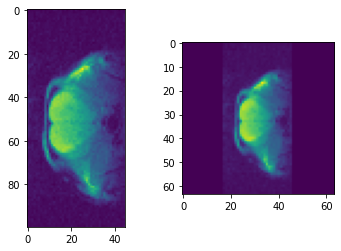

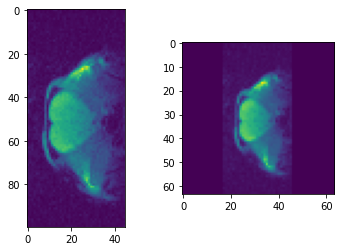

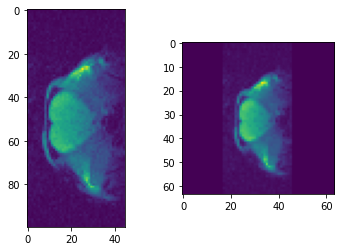

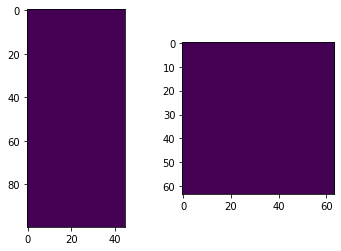

In [346]:
# visualize preprocessed bids volume
for i in range(bids_preprocessed.shape[0]):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(resampled_bids_temp[i])
    plt.subplot(1,2,2)
    plt.imshow(bids_preprocessed[i])
    plt.show()


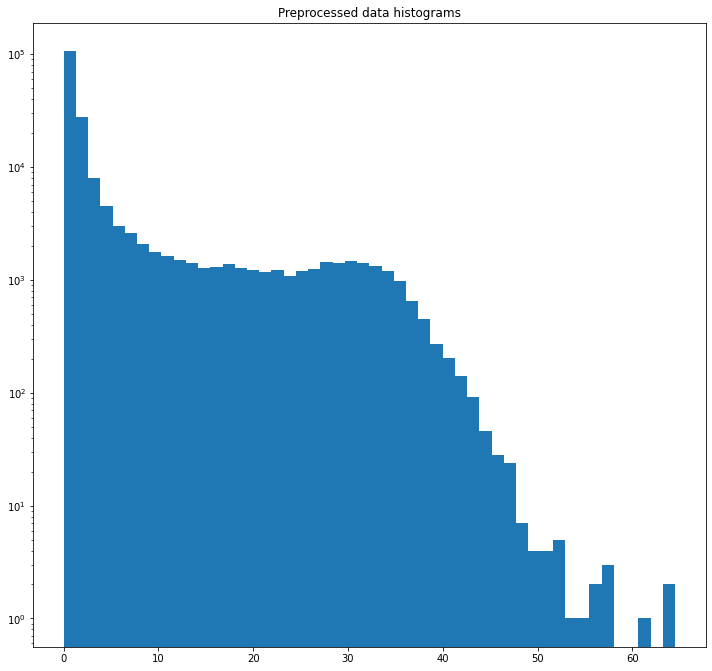

In [347]:
# Histogram after normalization
fig = plt.figure(figsize=(10, 10))
plt.hist(bids_preprocessed.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('Preprocessed data histograms')
plt.show()

## 1.6 Transform data
The transformation transforms the data to a pytorch Tensor and normalizes it

In [348]:
# preprocess with dataset transformations
print(resampled_bids.shape)
ds_transform = get_dataset_transformation('mlebe', opts=json_opts.augmentation,
                                          max_output_channels=json_opts.model.output_nc)
transformer = ds_transform['valid']()
transformed_bids = transformer(np.expand_dims(resampled_bids, -1))
transformed_bids = np.squeeze(transformed_bids.cpu().numpy())
print(transformed_bids.shape)
# remove black slices on the z-axis
diff = int(np.ceil(transformed_bids.shape[-1] - resampled_bids.shape[-1]))
transformed_bids = transformed_bids[...,int(np.ceil(diff / 2.)):  resampled_bids.shape[-1] + int(np.ceil(diff / 2.))]
print(transformed_bids.shape)

(100, 45, 45)


############# Augmentation Parameters #############
{'bias_field_prob': 0.5,
 'bias_magnitude_range': 1.0,
 'division_factor': (16, 16, 1),
 'inten_val': (1.0, 1.0),
 'max_deform': [0.1, 0.1, 0],
 'max_output_channels': 2,
 'name': 'mlebe',
 'normalization': 'normalize_medic',
 'patch_size': (128, 128, 1),
 'random_affine_prob': 0.5,
 'random_elastic_prob': 0,
 'random_flip_prob': 0.5,
 'random_noise_prob': 0.5,
 'rotate_val': 20,
 'scale_size': [64, 64, 96, 1],
 'scale_val': [1, 1],
 'shift_val': [0, 0]}
###################################################


(100, 64, 96)
(100, 64, 45)


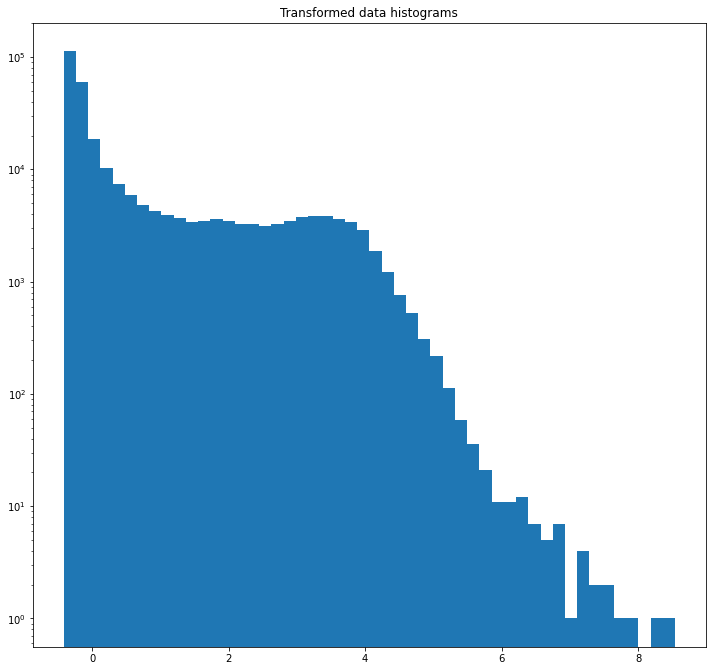

In [349]:
# Histogram after transformation
fig = plt.figure(figsize=(10, 10))
plt.hist(transformed_bids.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('Transformed data histograms')
plt.show()

## 1.7 Visualisation of the original bids volume and the transformed bids volume
Original to the left, transformed to the right

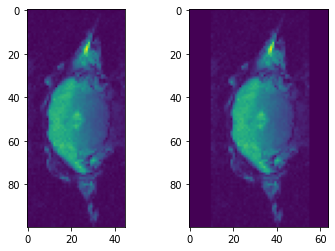

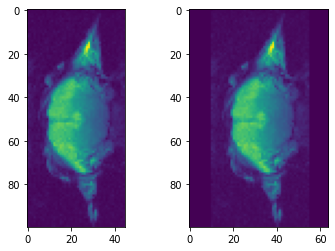

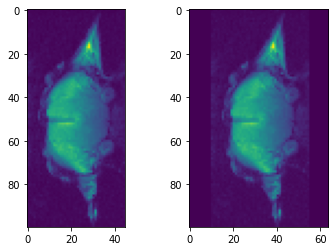

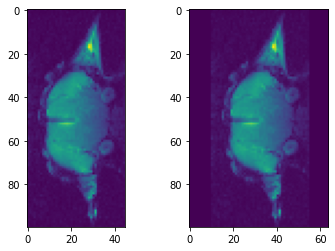

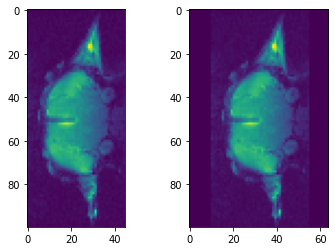

...

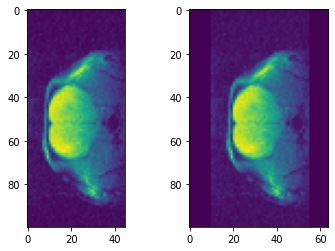

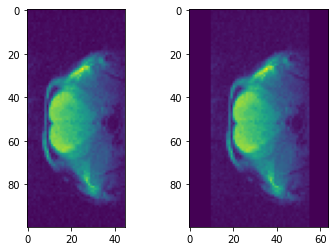

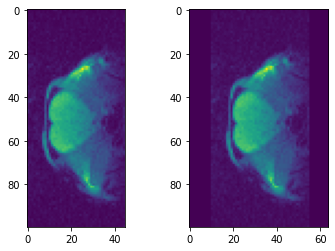

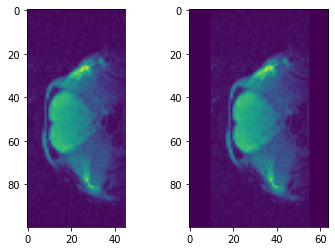

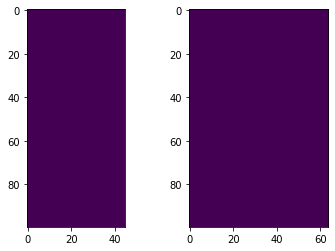

In [350]:
# Visualize transformed bids volume
for i in range(transformed_bids.shape[-1]):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(resampled_bids[...,i])
    plt.subplot(1,2,2)
    plt.imshow(transformed_bids[...,i])
    plt.show()


# 2. Predictions on the bids volume

In [351]:
# Set preprocessed image as input:
# switching to x,y,z for model prediction
in_file_data = np.moveaxis(bids_preprocessed, 0, 2)
# preprocess data for compatibility with model
transformed_input = transformer(np.expand_dims(in_file_data, -1))
# add dimension for batches
network_input = transformed_input.unsqueeze(0)
model.set_input(network_input)
model.test()
# predict
mask_pred = np.squeeze(model.pred_seg.cpu().byte().numpy()).astype(np.int16)
# switching to z,x,y
mask_pred = np.moveaxis(mask_pred, 2, 0)
network_input = np.moveaxis(np.squeeze(network_input.cpu().numpy()), 2, 0)
# need to un-pad on the z-axis to the original shape:
diff = int(np.ceil(mask_pred.shape[0] - ori_shape[0]))
mask_pred = mask_pred[int(np.ceil(diff / 2.)):  ori_shape[0] + int(np.ceil(diff / 2.)), :, :]
network_input = network_input[int(np.ceil(diff / 2.)):  ori_shape[0] + int(np.ceil(diff / 2.)), :, :]

/home/hendrik/miniconda3/envs/perfusionct/lib/python3.7/site-packages/torch/nn/functional.py:2457: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/home/hendrik/miniconda3/envs/perfusionct/lib/python3.7/site-packages/torch/nn/functional.py:2539: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/home/hendrik/miniconda3/envs/perfusionct/lib/python3.7/site-packages/torch/nn/functional.py:1386: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


## 2.1 Compare transformed volume with un-padded volume
The model was trained with 96 slices along the z-axis. The bids volume thus needs to be padded along the z-axis for the prediction, and the prediction then needs to be un-padded to the original shape.
Un-padding is a simple cropping.

In [352]:
# network output without unpadding
transformed_input = np.squeeze(transformed_input.cpu().numpy())
transformed_input_bids = transformed_input

In [353]:
def count_black_slices(volume, axis):
    count = 0
    for i in range(volume.shape[axis]):
        if axis == 2:
            if np.amax(volume[...,i]) <= 0:
                count +=1
        elif axis == 0:
            if np.amax(volume[i]) <= 0:
                count +=1
    return count

The number of non-black slice before and after the un-padding needs to be the same

In [354]:
count_tf = transformed_input.shape[-1] - count_black_slices(transformed_input, axis = 2)
count_nw = network_input.shape[0] - count_black_slices(network_input, axis = 0)
assert count_tf == count_nw, 'The number of non-black slice before and after the un-padding needs to be the same'
print(transformed_input.shape[-1] - count_black_slices(transformed_input, axis = 2))
print(network_input.shape[0] - count_black_slices(network_input, axis = 0))

44
44


## 2.2 Visualise predictions on the bids volume

(45, 64, 64)


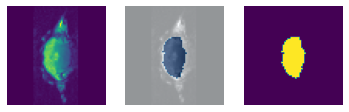

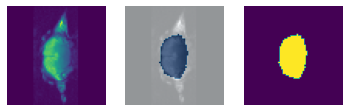

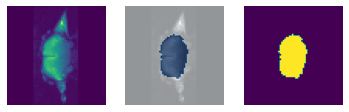

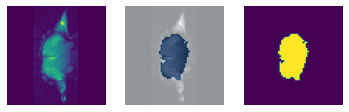

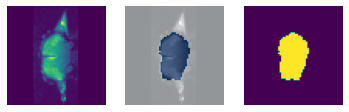

...

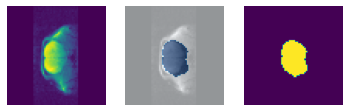

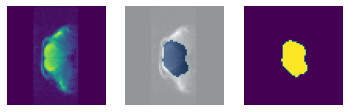

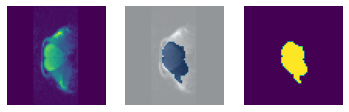

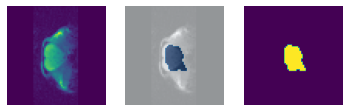

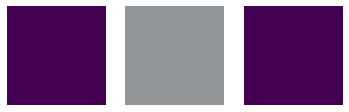

In [355]:
print(network_input.shape)
for slice in range(network_input.shape[0]):
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(network_input[slice])
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(network_input[slice], cmap='gray')
    plt.imshow(mask_pred[slice], cmap='Blues', alpha=0.6)
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(mask_pred[slice])
    plt.axis('off')
    plt.show()

# 3. Predicting on the registered volume
## 3.1 Visualisation of the registered volume

(63, 96, 48)
(96, 63, 48)


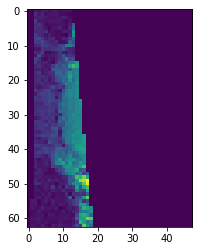

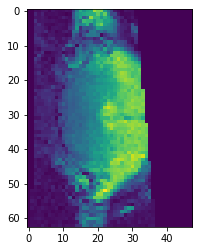

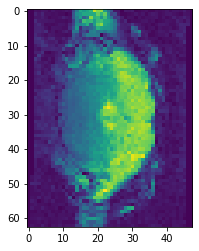

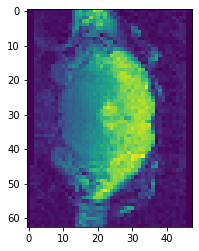

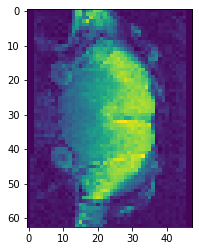

...

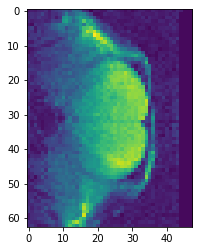

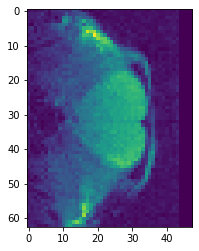

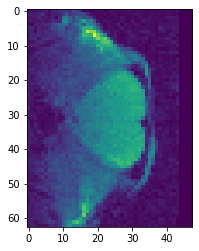

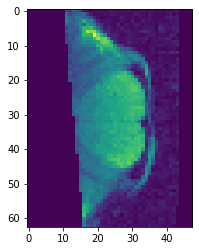

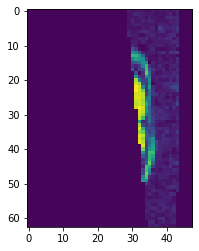

In [356]:
print(preprocessed_volume.shape)
preprocessed_volume = np.moveaxis(preprocessed_volume, 1,0)
print(preprocessed_volume.shape)
for i in range(preprocessed_volume.shape[0]):
    if not np.amax(preprocessed_volume[i]) <= 0:
        plt.imshow(preprocessed_volume[i])
        plt.show()

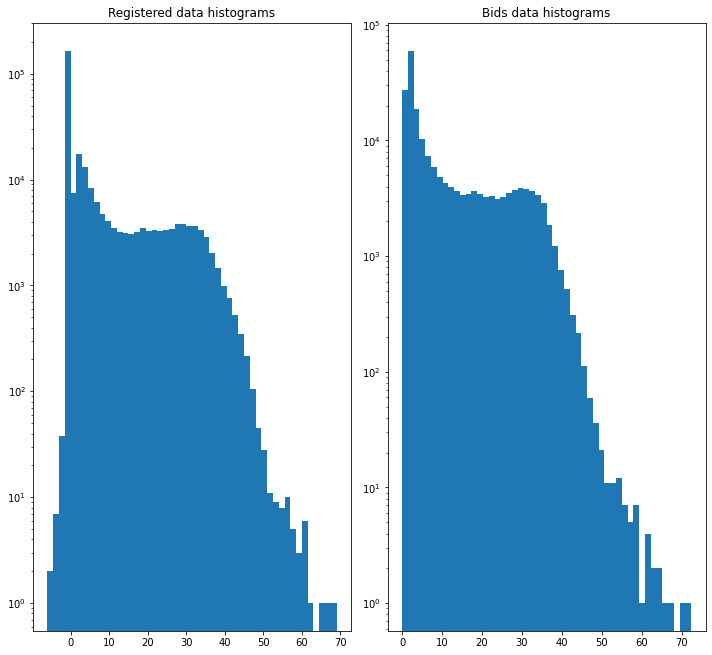

In [357]:
# Histogram after registration
fig = plt.figure(figsize=(10, 10))
plt.subplot(1,2,1)
plt.hist(preprocessed_volume.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('Registered data histograms')
plt.subplot(1,2,2)
plt.hist(resampled_bids.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('Bids data histograms')
plt.show()

## 3.2 Visualisation of the preprocessed and the unpreprocessed registered volume
Unpreprocessed to the left and preprocessed to the right

(96, 63, 48)
(96, 64, 64)


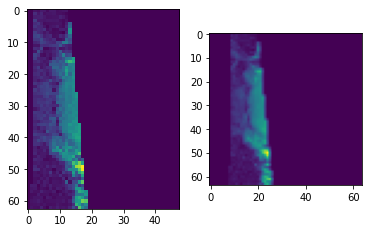

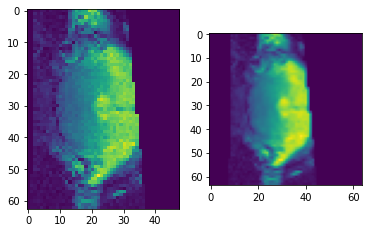

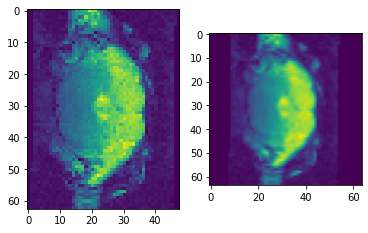

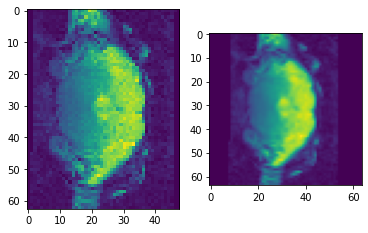

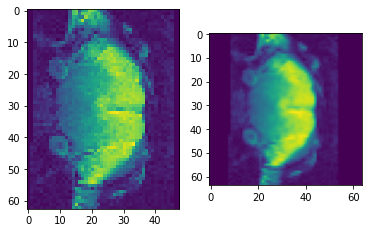

...

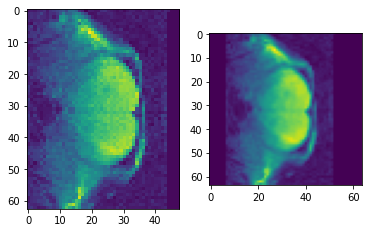

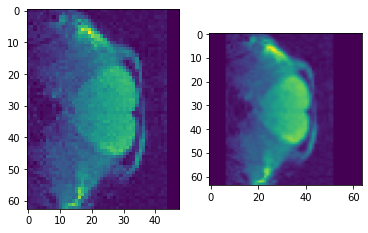

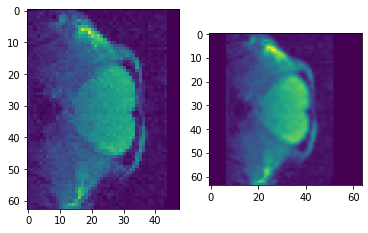

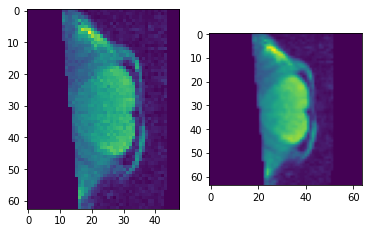

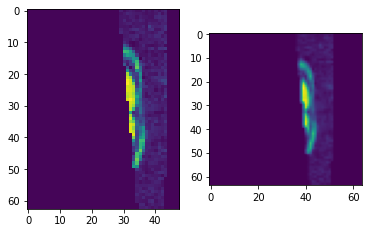

In [358]:
print(preprocessed_volume.shape)
reg_preprocessed = general.preprocess(preprocessed_volume, prediction_shape, 'coronal', switched_axis=True, normalize = False)
print(reg_preprocessed.shape)
for i in range(reg_preprocessed.shape[0]):
    if not np.amax(reg_preprocessed[i]) <= 0:
        plt.subplot(1,2,1)
        plt.imshow(preprocessed_volume[i])
        plt.subplot(1,2,2)
        plt.imshow(reg_preprocessed[i])
        plt.show()

In [359]:
print(reg_preprocessed.shape)
print(preprocessed_volume.shape)

(96, 64, 64)
(96, 63, 48)


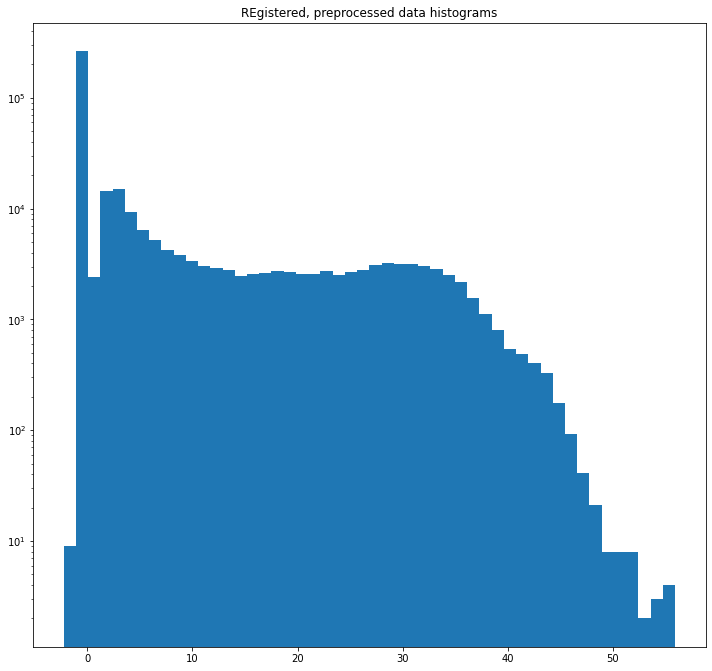

In [360]:
# Histogram after preprocess
fig = plt.figure(figsize=(10, 10))
plt.hist(reg_preprocessed.reshape((-1, )), bins=50, log=True)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.title('REgistered, preprocessed data histograms')
plt.show()

In [361]:
# Set registered image as input:
# switch to x,y,z
reg_preprocessed = np.moveaxis(reg_preprocessed,0,2)
# preprocess data for compatibility with model
transformed_input = transformer(np.expand_dims(reg_preprocessed, -1))
# add dimension for batches
network_input = transformed_input.unsqueeze(0)
model.set_input(network_input)
model.test()
# predict
mask_pred = np.squeeze(model.pred_seg.cpu().byte().numpy()).astype(np.int16)
# switching to z,x,y
mask_pred = np.moveaxis(mask_pred, 2, 0)
network_input = np.moveaxis(np.squeeze(network_input.cpu().numpy()), 2, 0)
print(mask_pred.shape, ori_shape)
# need to un-pad on the z-axis to the original shape:
diff = int(np.ceil(mask_pred.shape[0] - ori_shape[0]))
mask_pred = mask_pred[int(np.ceil(diff / 2.)):  ori_shape[0] + int(np.ceil(diff / 2.)), :, :]
network_input = network_input[int(np.ceil(diff / 2.)):  ori_shape[0] + int(np.ceil(diff / 2.)), :, :]

(96, 64, 64) (45, 100, 45)


## 3.3 Comparision between the transformed registered volume and the transformed bids volume
The transformed registered volumes are the volumes on which the classifier is trained and the transformed bids volumes are the volumes on which the classifier predicts in the samri-mlebe registering workflow.

The transformed registered images are on the left and the transformed bids images are on the right

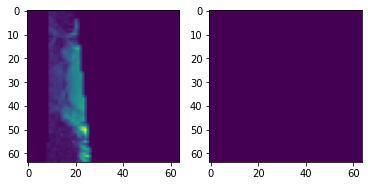

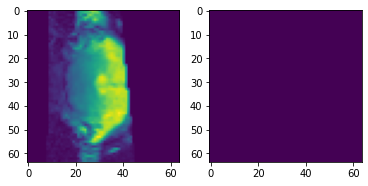

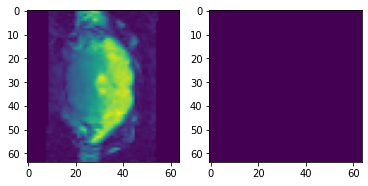

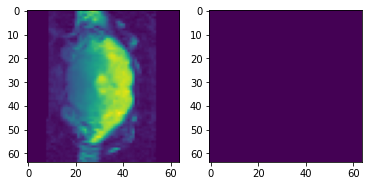

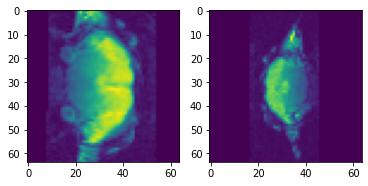

...

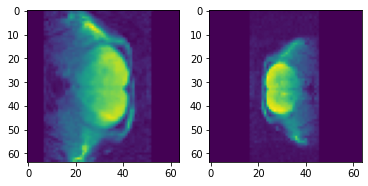

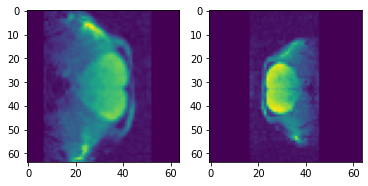

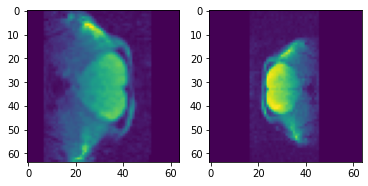

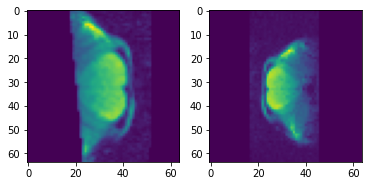

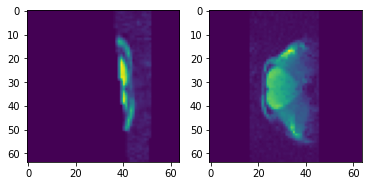

In [362]:
# visualizing transformed volume
transformed_input = np.squeeze(transformed_input.cpu().numpy())
for i in range(transformed_input.shape[-1]):
    if not np.amax(transformed_input[...,i]) <= 0:
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(transformed_input[...,i])
        plt.subplot(1,2,2)
        plt.imshow(transformed_input_bids[...,i])
        plt.show()

(45, 64, 64)


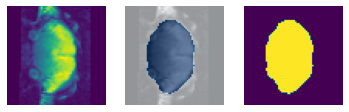

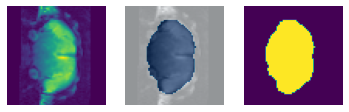

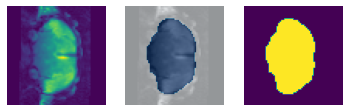

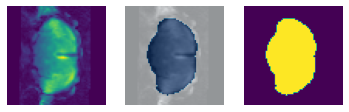

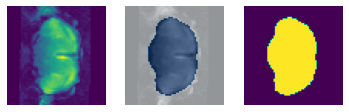

...

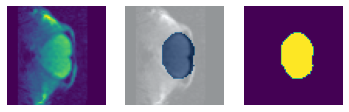

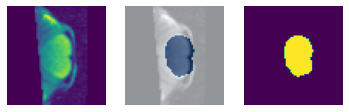

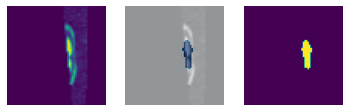

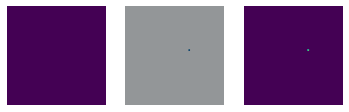

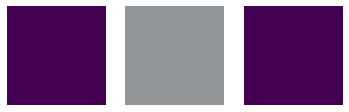

In [363]:
print(network_input.shape)
for slice in range(network_input.shape[0]):
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(network_input[slice])
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(network_input[slice], cmap='gray')
    plt.imshow(mask_pred[slice], cmap='Blues', alpha=0.6)
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(mask_pred[slice])
    plt.axis('off')
    plt.show()